# Prueba de anotaciones

##### Importación de las librerías necesarias

In [1]:
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import pylab
pylab.rcParams['figure.figsize'] = (8.0, 10.0)

##### Cargamos los datos del dataset de COCO

In [2]:
coco = COCO('dataset/instances_train2017.json')
# Get all existing category IDs and names in the whole dataset
category_ids = coco.getCatIds()
categories = coco.loadCats(category_ids)
#categories

loading annotations into memory...
Done (t=16.49s)
creating index...
index created!


Vamos a definir ahora las categorías con las que haremos la prueba.

In [3]:
Categories = ['keyboard','laptop']
#Categories=['keyboard','laptop','remote','mouse','tv','cell phone']

Posteriormente, cargamos los datos relativos a estas categorías.

In [4]:
# get all images containing given categories
catIds = coco.getCatIds(catNms=Categories)

imgIds = []

for cat in catIds:
    imgIds += coco.getImgIds(catIds=cat)


In [5]:
annIds = coco.getAnnIds(imgIds=imgIds, catIds=catIds, iscrowd=None)
imgsAnns = coco.loadAnns(annIds)

imgsInfo = coco.loadImgs(imgIds)

imgsInfo = sorted(imgsInfo, key=lambda x: x["id"])
imgsAnns = sorted(imgsAnns, key=lambda x: x["image_id"])

In [6]:
lista=[]
i=0
j=0
while j < len(categories):
    if categories[j]['id']==i:
        lista.append(categories[j])
        j += 1
    else:
        lista.append({})
    i+=1

Definimos unas funciones para obtener visualmente las anotaciones de las imágenes.

In [7]:
def draw_boxes(image_info, boxes, classes, color='r', alpha=0.5):
    fig, ax = plt.subplots()
    ax.axis('off')
    
    # Display the image
    I = io.imread(image_info['coco_url'])
    ax.imshow(I)
    polygons = []

    for i in range(len(boxes)):

            [bbox_x, bbox_y, bbox_w, bbox_h] = boxes[i]
            poly = [[bbox_x, bbox_y], [bbox_x, bbox_y+bbox_h], [bbox_x+bbox_w, bbox_y+bbox_h], [bbox_x+bbox_w, bbox_y]]
            np_poly = np.array(poly).reshape((4,2))
            polygons.append(Polygon(np_poly))
            ax.text(bbox_x, bbox_y-7,classes[i], fontsize=10, color='r', verticalalignment='center')
            
            
    p = PatchCollection(polygons, facecolor='blue', edgecolors='red', linewidths=3, alpha=0.4)
    ax.add_collection(p)
    # Show the image with the rectangle
    plt.show()

In [8]:
def draw_boxes_by_index(INDEX=0):
    annotations = []
    bboxes = []
    classes = []
    for ann in imgsAnns:
        if ann['image_id'] == imgsInfo[INDEX]['id']:
            annotations.append(ann)
    for ann in annotations:
        bboxes.append(ann['bbox'])
        classes.append(lista[ann['category_id']]['name'])

    draw_boxes(imgsInfo[INDEX], bboxes, classes)

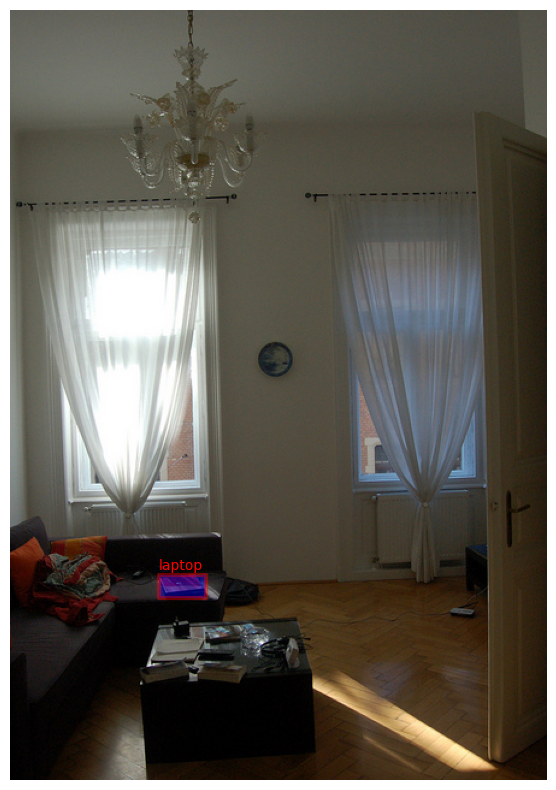

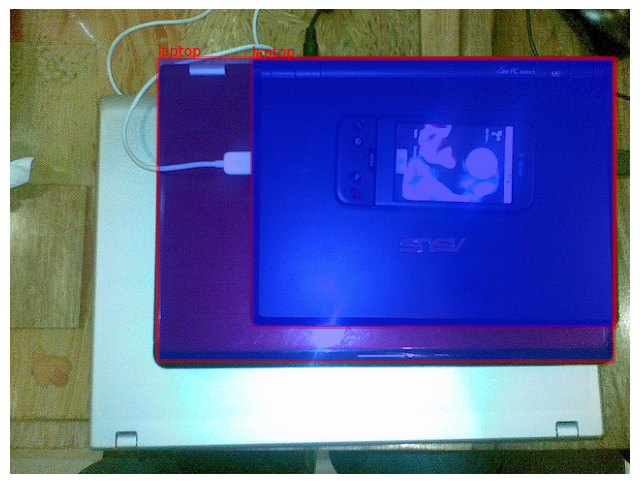

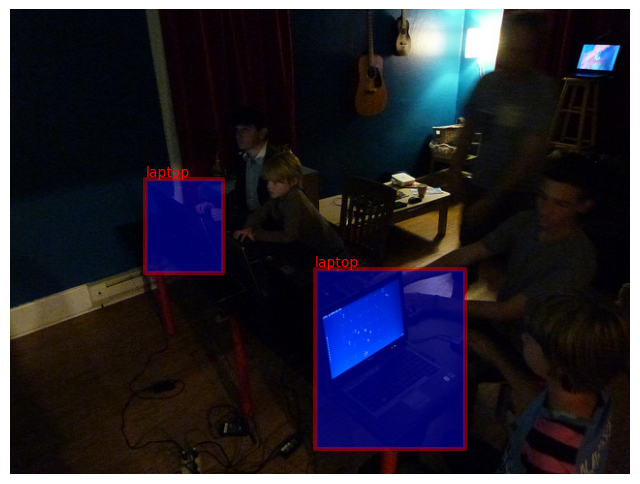

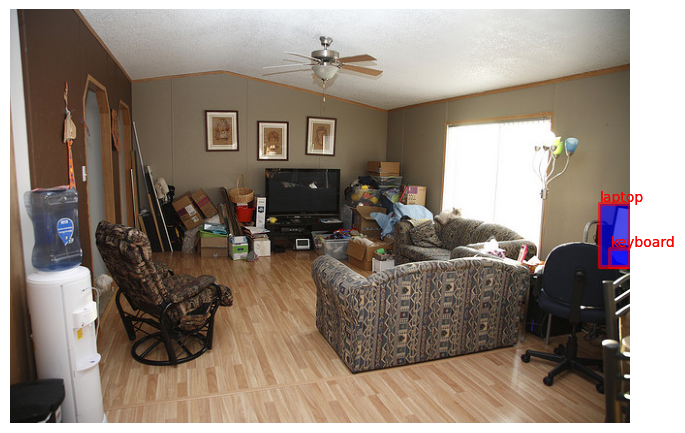

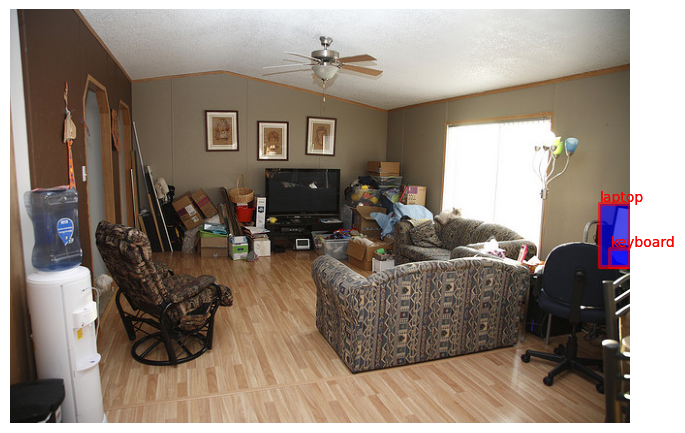

...

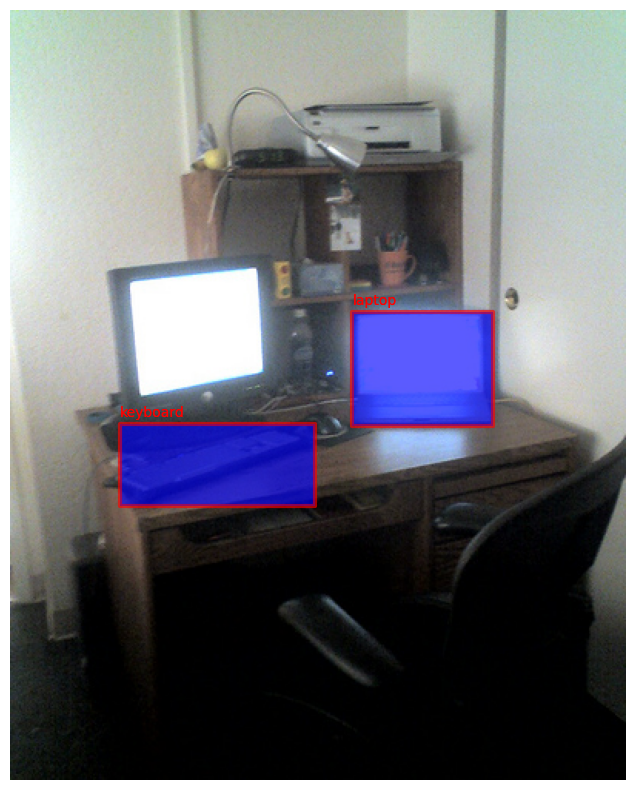

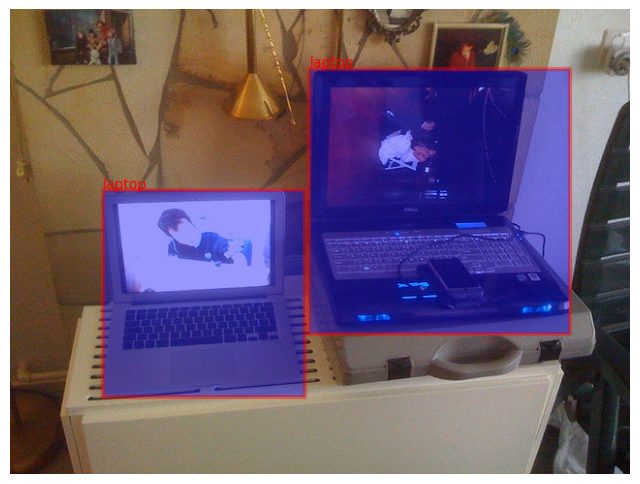

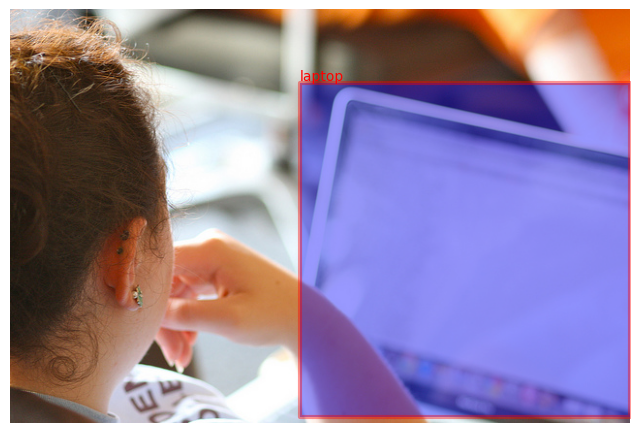

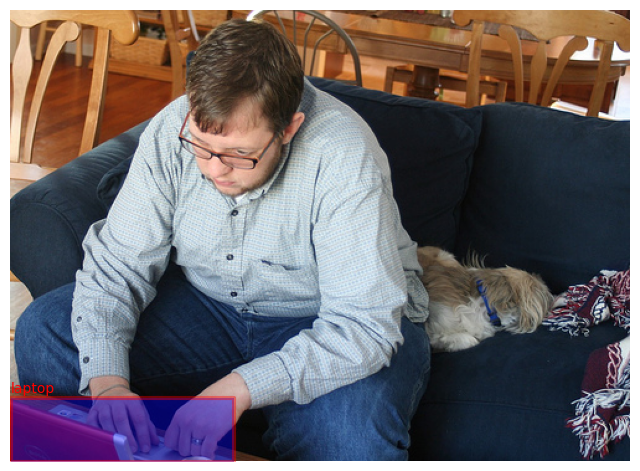

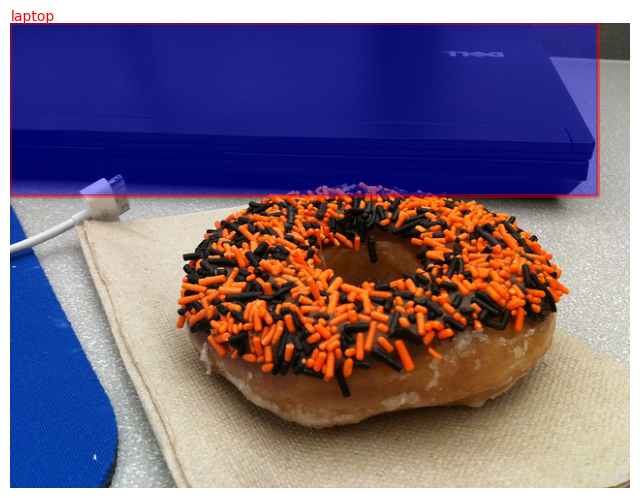

In [9]:
for i in range(20):
    draw_boxes_by_index(i)